In [1]:
!pip install tifffile matplotlib

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 25.0.1 -> 26.2.1
[notice] To update, run: pip install --upgrade pip


In [2]:
!pip install czifile

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 25.0.1 -> 26.2.1
[notice] To update, run: pip install --upgrade pip


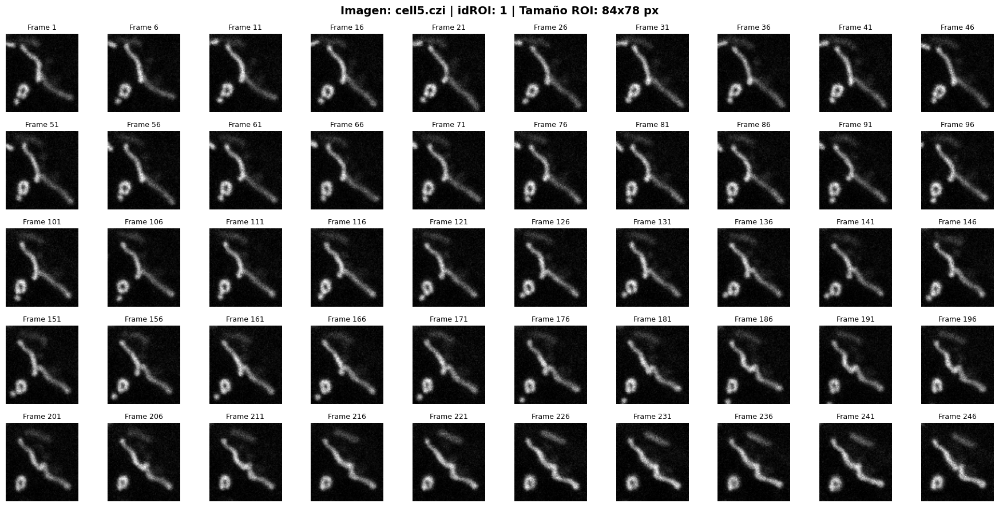

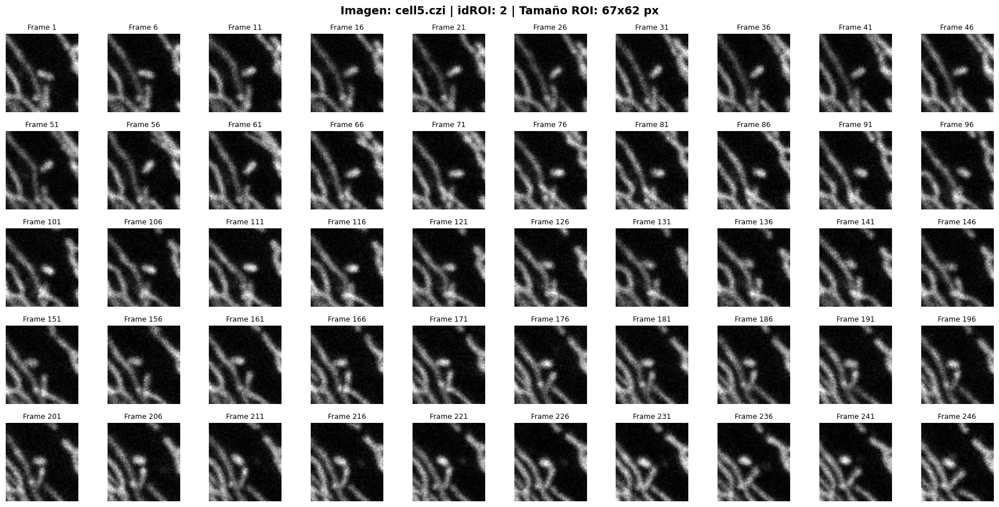

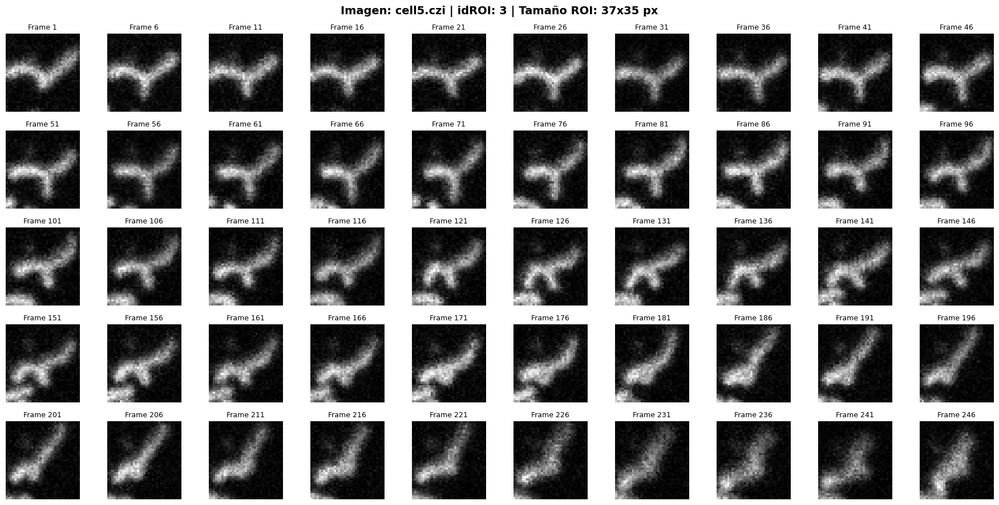

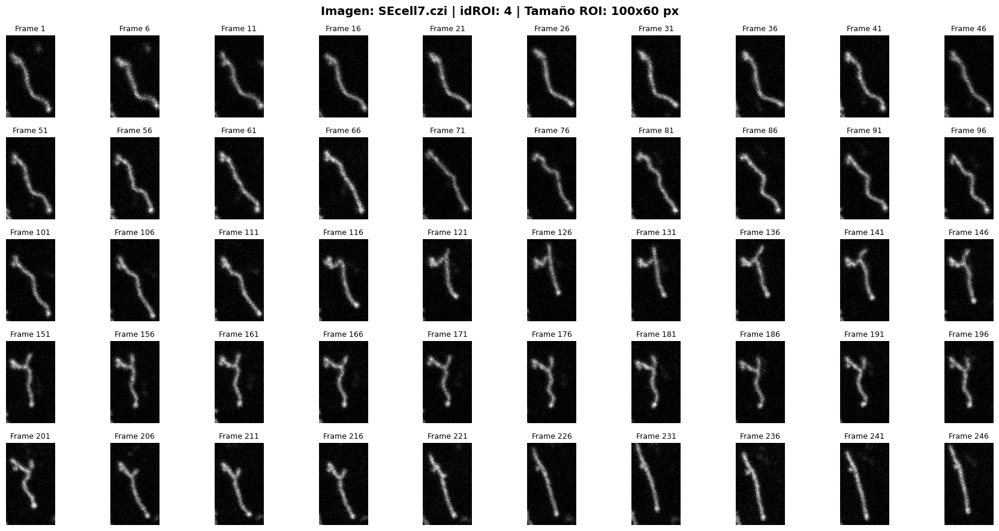

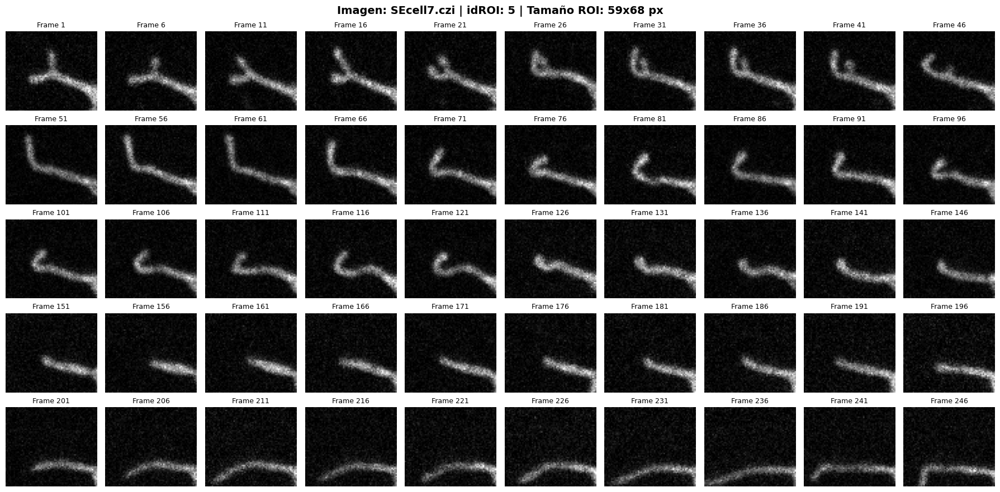

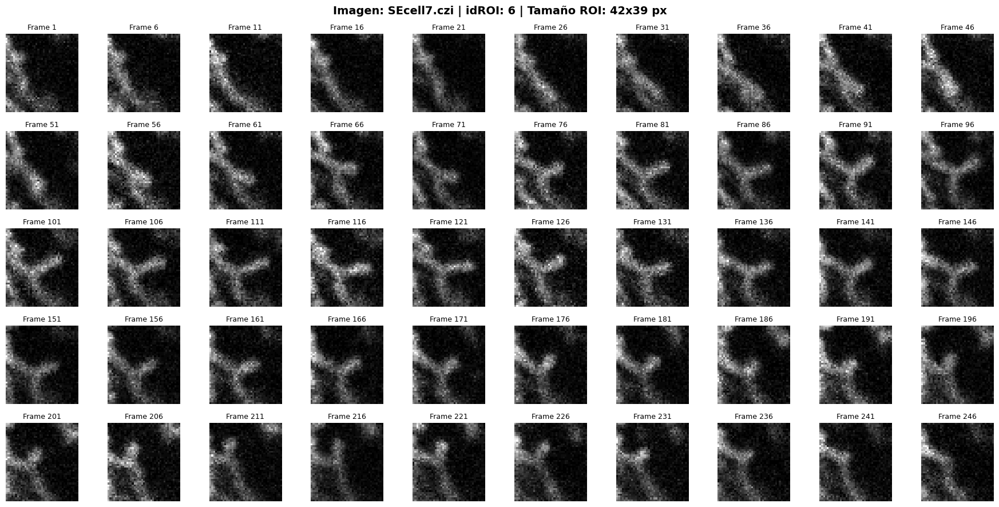

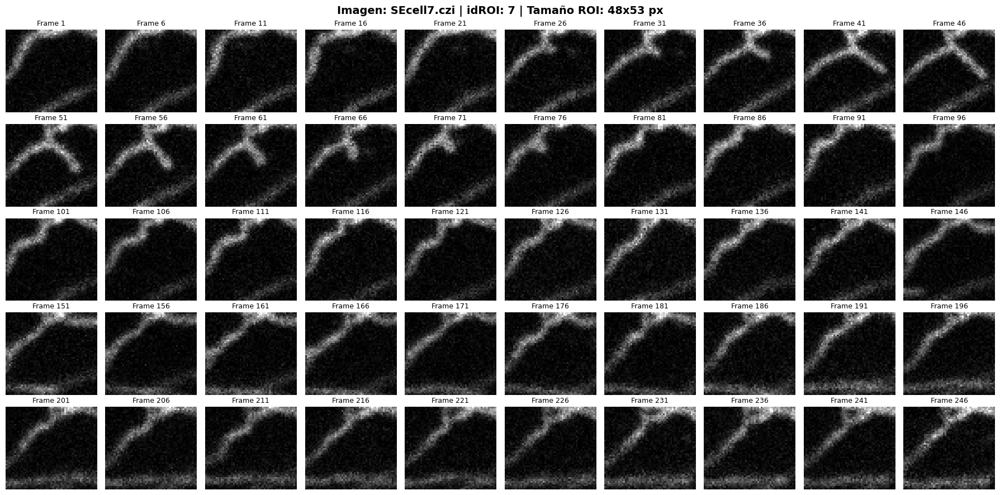

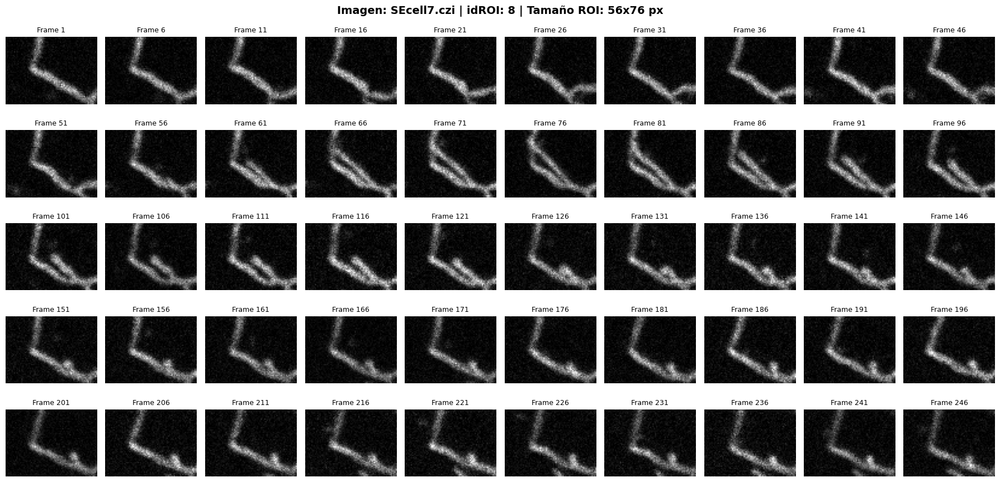

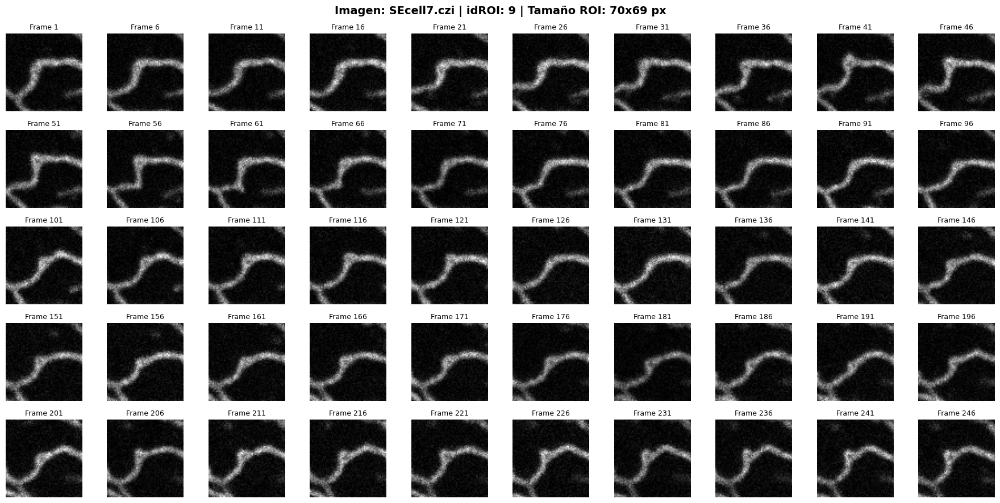

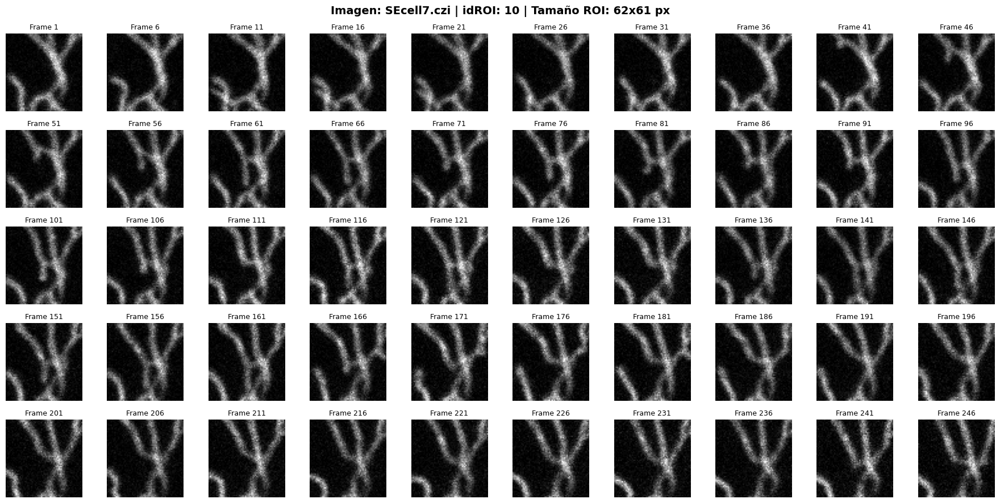

In [3]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from aicspylibczi import CziFile
from pathlib import Path

# 1. Leer el archivo CSV con las coordenadas
df = pd.read_csv("coordenadas_rois.csv")

# 2. Recorrer el CSV
for index, fila in df.iterrows():
    # Construir la ruta limpia
    pth = Path("img/" + fila["nombre_imagen"])
    czi = CziFile(pth)

    # --- TU BLOQUE DE LECTURA DE FRAMES ---
    img_frames = []
    # CORRECCIÓN: Accedemos al índice [1] de la tupla para obtener los frames enteros (ej: 250)
    n_frames = czi.size[1]

    for t in range(0, n_frames):
        frame_t, _ = czi.read_image(Z=0, T=t, C=0, H=0)
        img_frames.append(frame_t[0, 0, 0, 0, :, :])

    img_frames = np.array(img_frames)
    # ---------------------------------------------

    # 3. Extraer las coordenadas del CSV y hacer el recorte (ROI)
    ymin, ymax = int(fila["ymin"]), int(fila["ymax"])
    xmin, xmax = int(fila["xmin"]), int(fila["xmax"])
    roi = img_frames[:, ymin:ymax, xmin:xmax]

    # --- CONFIGURACIÓN DEL SALTO TEMPORAL ---
    salto = 5  # Podés cambiar este número por el salto que prefieras

    # 4. CONFIGURAR LA CUADRÍCULA 5x10 PARA ESTA ROI ESPECÍFICA
    filas = 5
    columnas = 10
    fig, axes = plt.subplots(filas, columnas, figsize=(18, 9))

    # Graficamos 50 subplots usando el salto temporal definido
    for idx in range(50):
        r = idx // columnas
        c = idx % columnas

        # Calculamos el frame real multiplicando el índice de la grilla por el salto
        frame_real = idx * salto

        # Validamos que no nos pasemos de la cantidad total de frames que tiene la ROI
        if frame_real < roi.shape[0]:
            # Mostrar el frame recortado saltando de a 5
            axes[r, c].imshow(roi[frame_real, :, :], cmap="gray")

            # Ponemos el número real del frame en el título para que sepas cuál estás viendo
            axes[r, c].set_title(f"Frame {frame_real+1}", fontsize=9)
        else:
            # Si el video es más corto que la grilla al aplicar el salto, dejamos el resto limpio
            axes[r, c].text(
                0.5,
                0.5,
                "Fin",
                ha="center",
                va="center",
                color="gray",
                fontsize=10,
            )

        axes[r, c].axis("off")

    # Título principal de la ventana indicando el intervalo visualizado
    fig.suptitle(
        f"Imagen: {fila['nombre_imagen']} | idROI: {fila['id_roi']} | Tamaño ROI: {roi.shape[1]}x{roi.shape[2]} px",
        fontsize=14,
        fontweight="bold",
    )

    plt.tight_layout()
    plt.show()


In [4]:
# 1. Leer el archivo CSV con las coordenadas
df = pd.read_csv("coordenadas_rois.csv")
display(df)

,nombre_imagen,id_roi,xmin,xmax,ymin,ymax,low_certainty
0,cell5.czi,1,52,130,224,308,False
1,cell5.czi,2,438,500,351,418,True
2,cell5.czi,3,444,479,170,207,False
3,SEcell7.czi,4,330,390,55,155,False
4,SEcell7.czi,5,44,112,364,423,False
5,SEcell7.czi,6,365,404,274,316,False
6,SEcell7.czi,7,144,197,361,409,False
7,SEcell7.czi,8,88,164,286,342,False
8,SEcell7.czi,9,147,216,281,351,True
9,SEcell7.czi,10,123,184,139,201,False


Casos seguros de branching

In [5]:
def read_czi_to_frames(path): 
    czi = CziFile(path)

    img_frames = []
    n_frames = czi.size[1]
    for t in range(0, n_frames):
        frame_t, _ = czi.read_image(Z=0, T=t, C=0, H=0)
        img_frames.append(frame_t[0, 0, 0, 0, :, :])

    return np.array(img_frames)

def roi_crop(img_frames, ymin, ymax, xmin, xmax):
    return img_frames[:, ymin:ymax, xmin:xmax]

In [6]:
def graficar_roi(roi, fila, axis, frame_inicio, salto, frame_fin):
    filas, columnas = axis
    fig, axes = plt.subplots(filas, columnas, figsize=(10, 5))

    for idx in range(axis[0]*axis[1]):
        r = idx // columnas
        c = idx % columnas

        # Partimos desde el inicio elegido sumando los saltos calculados
        frame_real = frame_inicio + (idx * salto)

        if frame_real < roi.shape[0] and frame_real < frame_fin:
            axes[r, c].imshow(roi[frame_real, :, :], cmap="gray")
            axes[r, c].set_title(f"F{frame_real+1}", fontsize=9)
        else:
            # Si el frame real supera el fin elegido o el video, se limpia el subplot
            axes[r, c].axis("off")
        axes[r, c].axis("off")

    fig.suptitle(
        f"{fila['nombre_imagen']} | id={fila['id_roi']}",
        #"Rango definido: {frame_inicio+1} al {frame_fin} (Salto calculado: cada {salto_dinamico} frames)",
        fontsize=14,
        fontweight="bold",
    )
    plt.tight_layout()

        # --- AGREGAMOS EL GUARDADO DEL JPEG ---
    # Limpiamos el nombre: pasa de 'cell5.czi' a solo 'cell5'
    nombre_limpio = Path(fila["nombre_imagen"]).stem
    id_roi = fila["id_roi"]

    # Genera el nombre automático: ej. 'cell5_roi_1.jpg'
    nombre_archivo = f"roi/{nombre_limpio}_roi_{id_roi}.jpg"

    # Guardamos en alta definición (dpi=200) recortando bordes blancos sobrantes
    plt.savefig(nombre_archivo, format="jpg", dpi=200, bbox_inches="tight")
    # --------------------------------------

    plt.show()


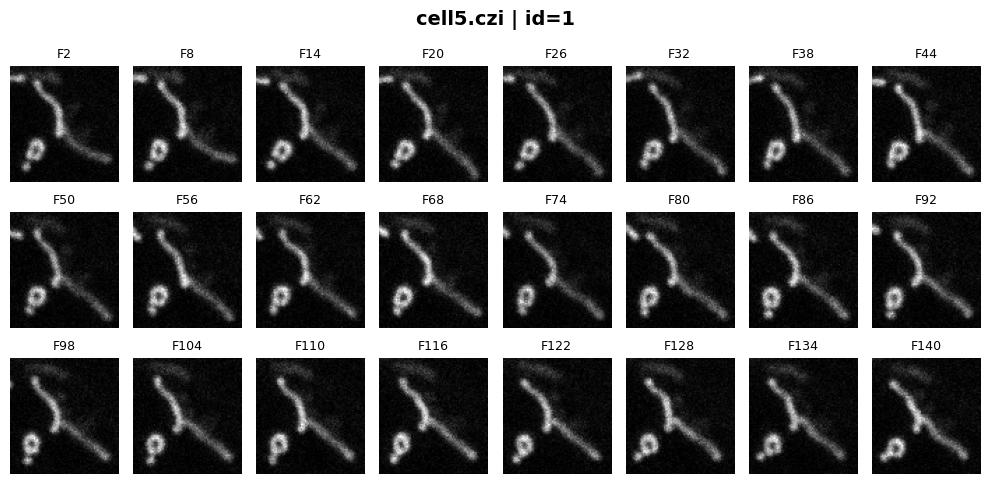

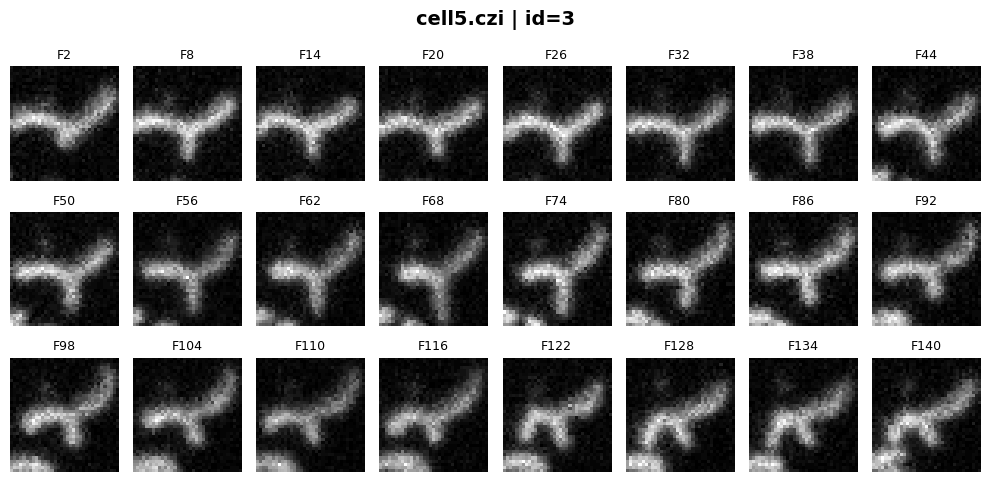

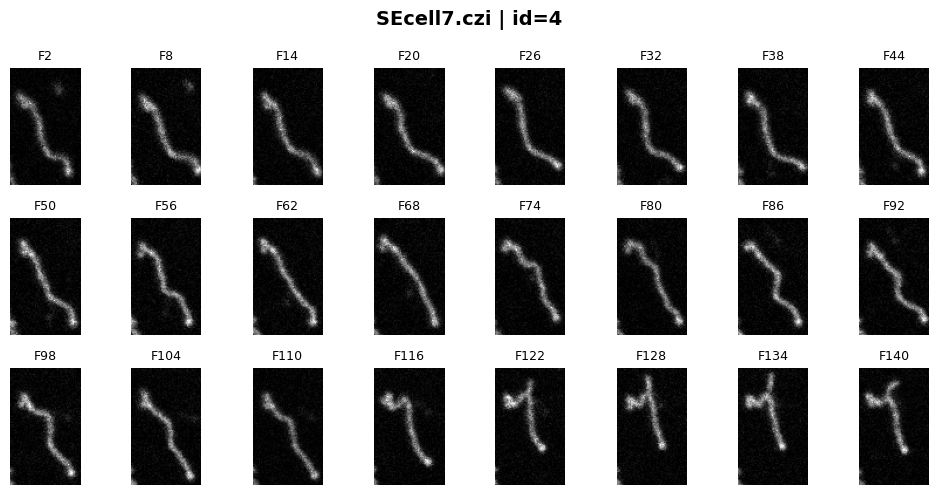

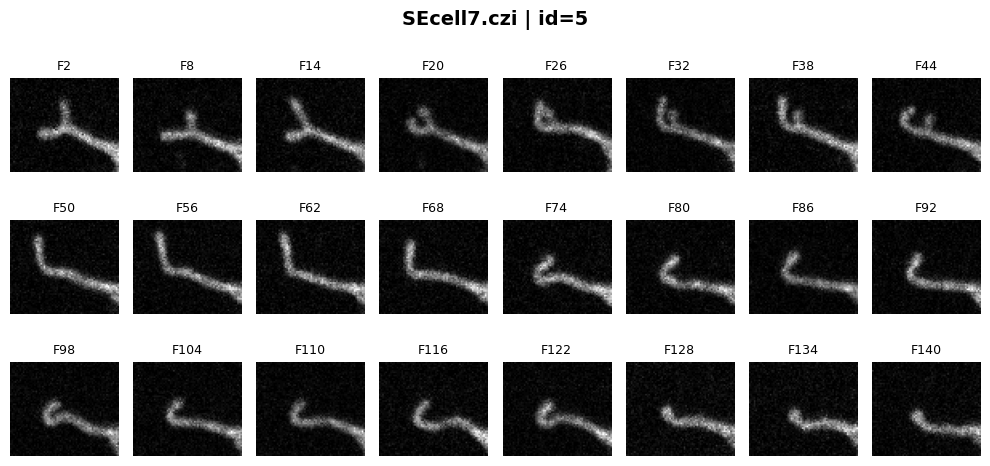

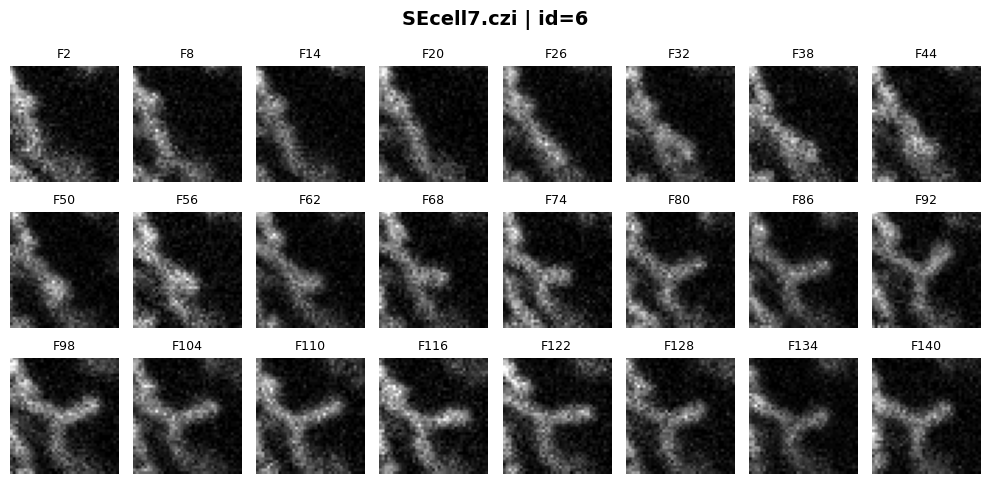

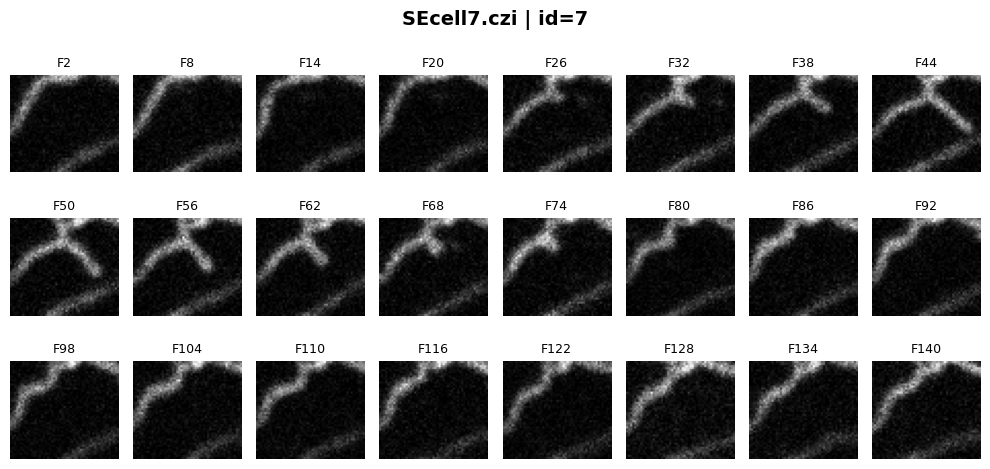

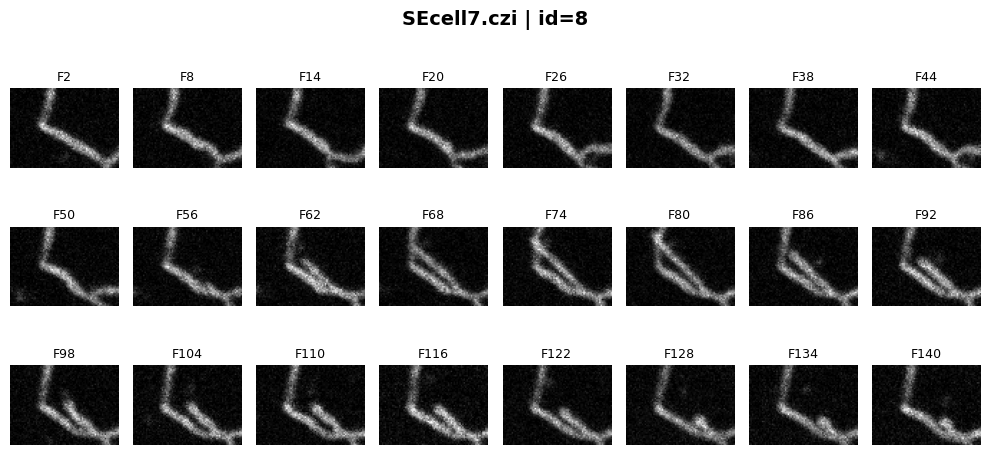

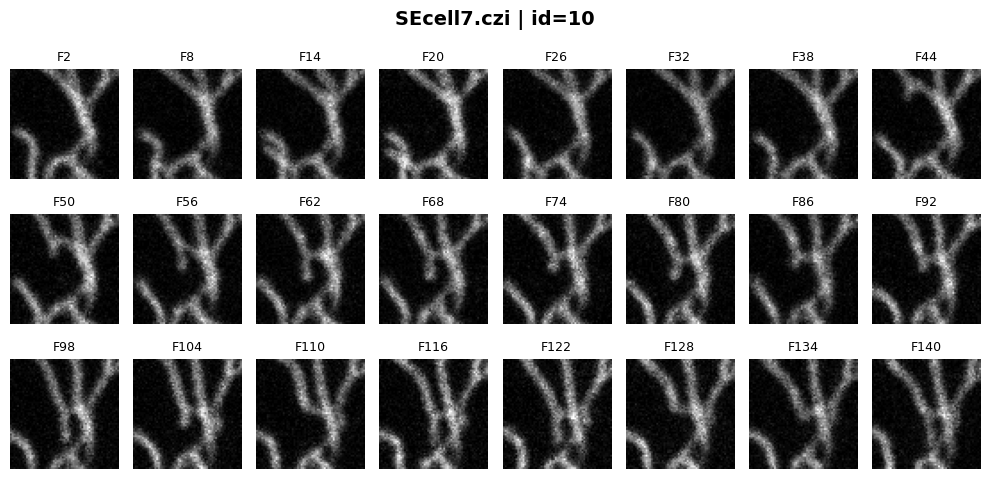

In [8]:
df_false = df[df["low_certainty"].astype(str).str.lower() == "false"]

# RANGO DINÁMICO: Definí acá el tramo que querés inspeccionar de tus ROIs normales
frame_inicio = 1  # Cambiá este valor a gusto
frame_fin = 150  # Cambiá este valor a gusto

# Calculamos cuántos frames hay en tu rango elegido y el salto para llenar la cuadrícula 5x10
rango_total = frame_fin - frame_inicio
salto_dinamico = max(1, rango_total // 24)

axis = 3,8

for index, fila in df_false.iterrows():
    img_frames = read_czi_to_frames(Path("img/" + fila["nombre_imagen"]))

    roi_actual = roi_crop(img_frames,
                   ymin=int(fila["ymin"]), ymax=int(fila["ymax"]), 
                   xmin=int(fila["xmin"]), xmax=int(fila["xmax"]))

    # Graficar cuadrícula 5x10 con rango y salto dinámico
    graficar_roi(roi=roi_actual, fila=fila, axis=axis, frame_inicio=frame_inicio, frame_fin=frame_fin, salto=salto_dinamico)

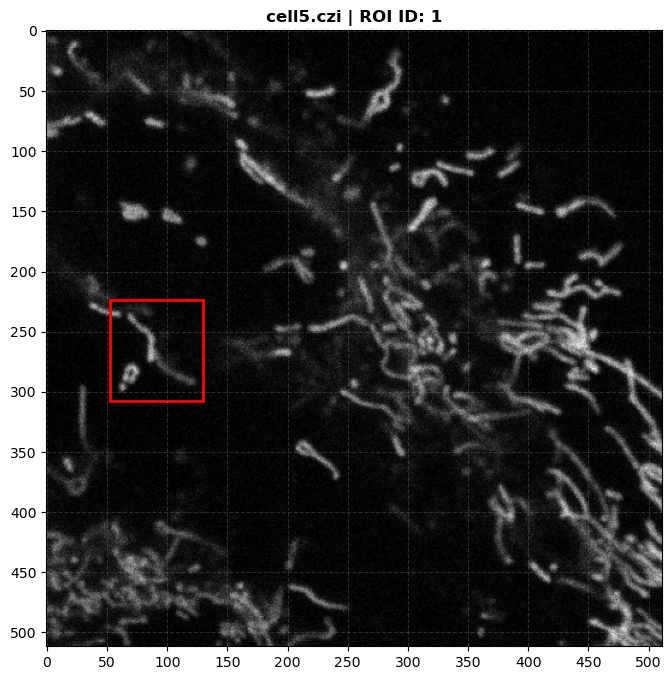

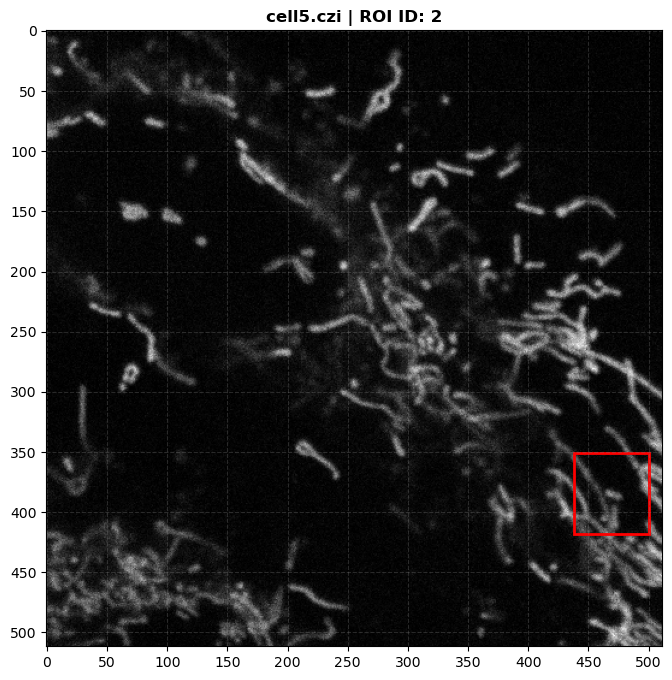

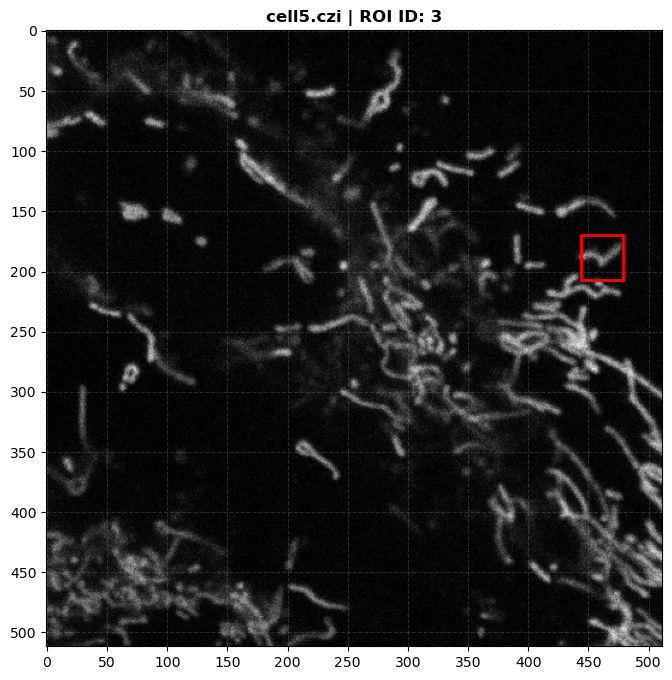

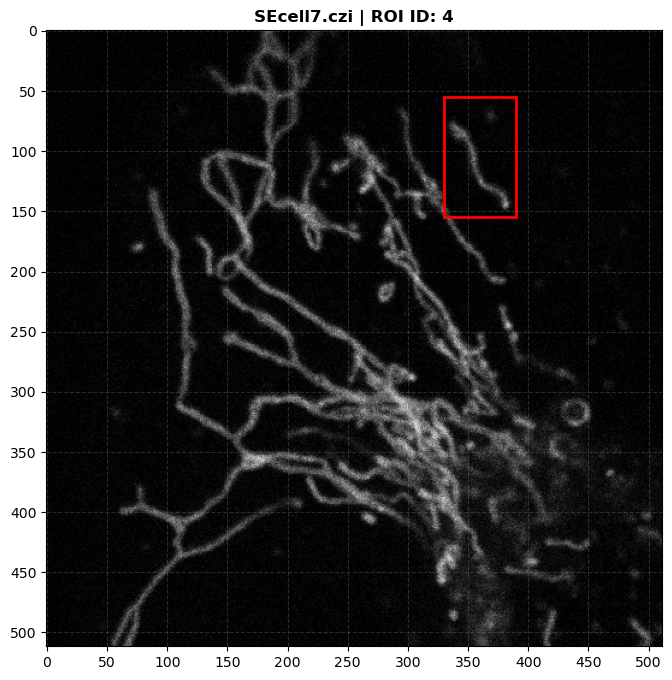

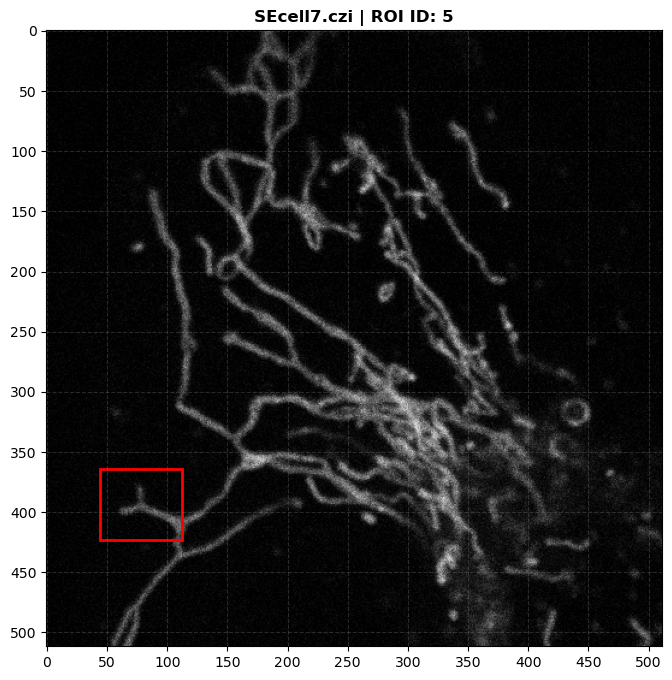

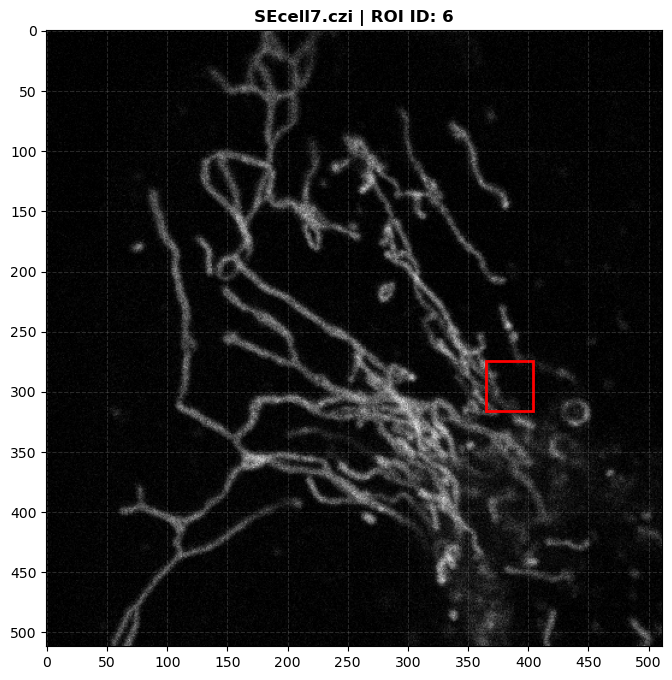

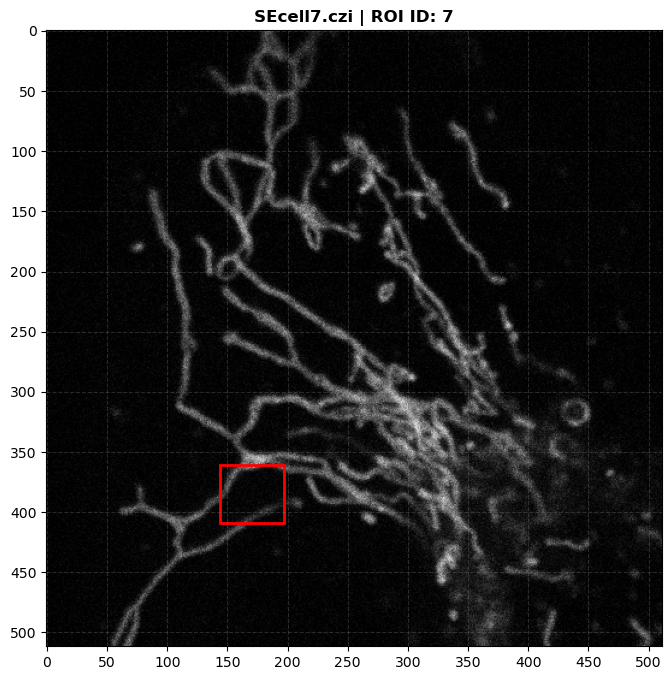

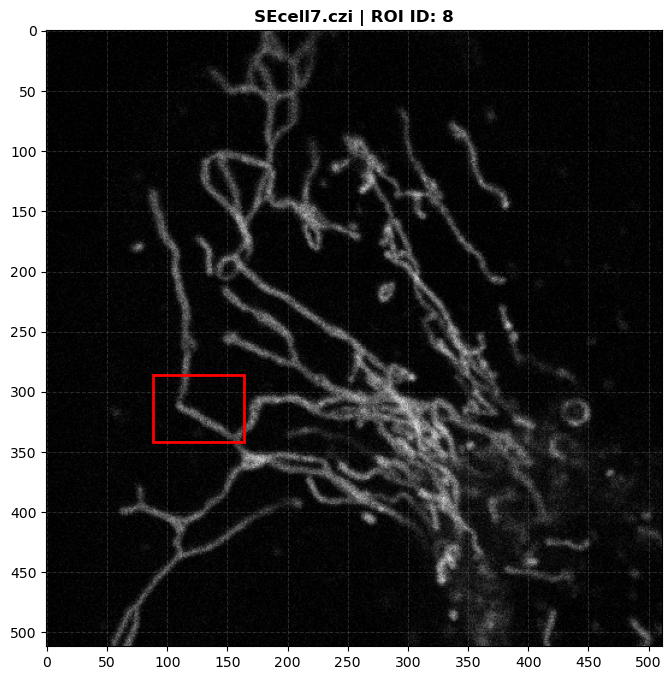

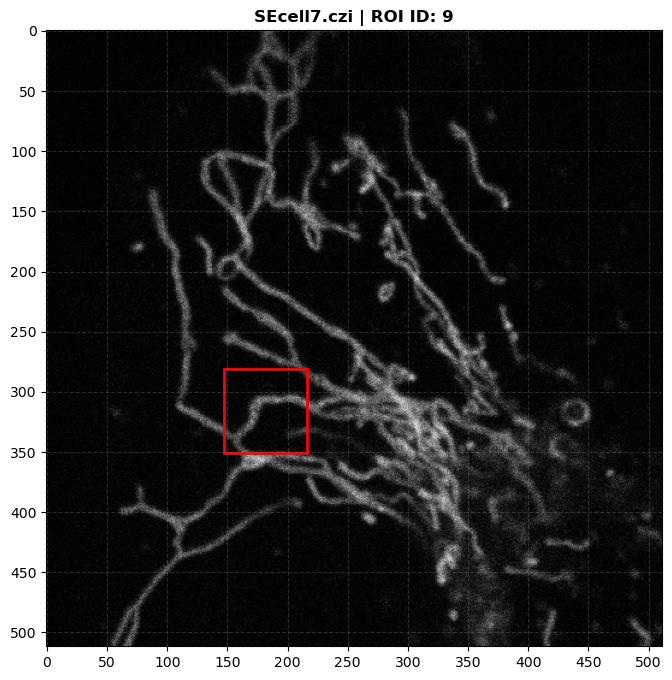

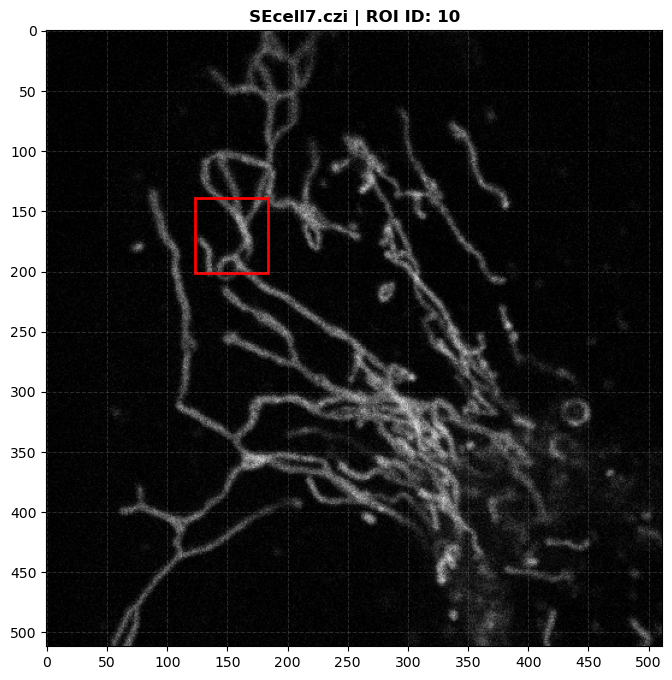

In [3]:
import matplotlib.patches as patches
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from aicspylibczi import CziFile
from pathlib import Path

# 1. Leer tu CSV de coordenadas
df = pd.read_csv("coordenadas_rois.csv")

# 2. Recorrer cada ROI para verificar su posición en la imagen completa
for index, fila in df.iterrows():
    pth = Path("img/" + fila["nombre_imagen"])
    czi = CziFile(pth)

    # Leemos solo el primer frame (T=0) de la imagen completa para que sea súper rápido
    frame_completo_t0, _ = czi.read_image(Z=0, T=0, C=0, H=0)
    img_completa = frame_completo_t0[0, 0, 0, 0, :, :]

    # Extraer las coordenadas actuales del CSV
    ymin = int(fila["ymin"])
    ymax = int(fila["ymax"])
    xmin = int(fila["xmin"])
    xmax = int(fila["xmax"])

    # Calcular el ancho y alto del recuadro para Matplotlib
    ancho_recuadro = xmax - xmin
    alto_recuadro = ymax - ymin

    # 3. Graficar la imagen completa con el cuadro encima
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.imshow(img_completa, cmap="gray")

    # Dibujamos el cuadro rojo usando las coordenadas directas del CSV
    rect = patches.Rectangle(
        (xmin, ymin),
        ancho_recuadro,
        alto_recuadro,
        linewidth=2,
        edgecolor="r",
        facecolor="none",
    )
    ax.add_patch(rect)

    # Configuración de los títulos y etiquetas
    ax.set_title(
        f"{fila['nombre_imagen']} | ROI ID: {fila['id_roi']}",
        fontsize=12,
        fontweight="bold",
    )

    # Forzar a Matplotlib a mostrar los números de los píxeles cada 50 px para ayudarte a medir
    ax.set_xticks(np.arange(0, img_completa.shape[1], 50))
    ax.set_yticks(np.arange(0, img_completa.shape[0], 50))
    ax.grid(True, color="gray", alpha=0.3, linestyle="--")

    plt.show()


Casos de branching dudoso

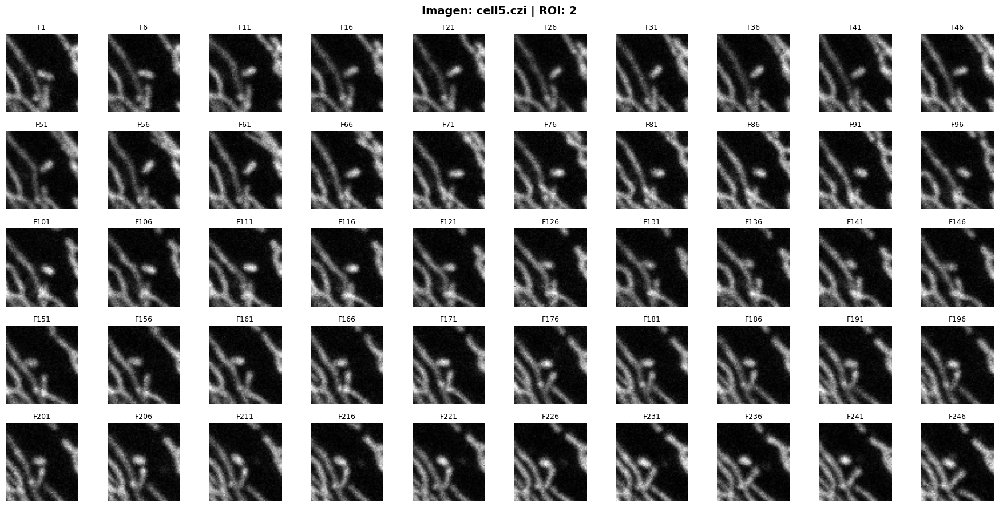

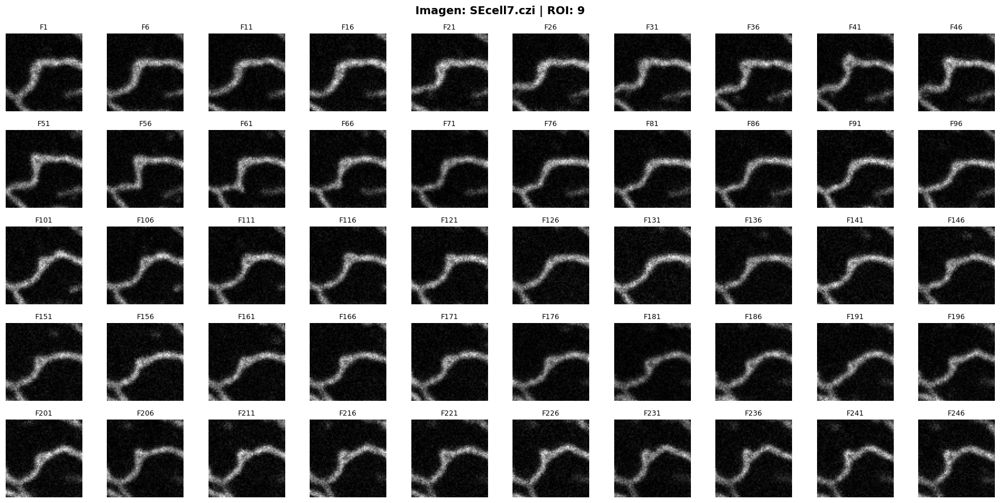

In [4]:
df_true = df[df["low_certainty"].astype(str).str.lower() == "true"]

salto_fijo = 5

for index, fila in df_true.iterrows():
    pth = Path("img/" + fila["nombre_imagen"])
    czi = CziFile(pth)

    # Lectura de frames
    img_frames = []
    n_frames = czi.size[1]
    for t in range(0, n_frames):
        frame_t, _ = czi.read_image(Z=0, T=t, C=0, H=0)
        img_frames.append(frame_t[0, 0, 0, 0, :, :])
    img_frames = np.array(img_frames)

    # Recorte ROI
    ymin, ymax = int(fila["ymin"]), int(fila["ymax"])
    xmin, xmax = int(fila["xmin"]), int(fila["xmax"])
    roi = img_frames[:, ymin:ymax, xmin:xmax]

    # Graficar cuadrícula 5x10 con salto fijo cada 5
    filas, columnas = 5, 10
    fig, axes = plt.subplots(filas, columnas, figsize=(18, 9))

    for idx in range(50):
        r = idx // columnas
        c = idx % columnas

        frame_real = idx * salto_fijo

        if frame_real < roi.shape[0]:
            axes[r, c].imshow(roi[frame_real, :, :], cmap="gray")
            axes[r, c].set_title(f"F{frame_real+1}", fontsize=9)
        else:
            axes[r, c].axis("off")
        axes[r, c].axis("off")

    fig.suptitle(
        f"Imagen: {fila['nombre_imagen']} | ROI: {fila['id_roi']}",
        fontsize=14,
        fontweight="bold",
    )
    plt.tight_layout()
    plt.show()
